## Set up MLFLOW

In [ ]:
!pip install mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.1/148.1 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.3 MB/s eta 0:00:00
  Created wheel for databricks-cli: filename=databricks_cli-0.17.7-py3-none-any.whl size=143861 sha256=39cf1c7a2e4b35796f4ffd2f885fb8d386f22bf857b86b9f725cf4b57ba0c7d9
  Stored in directory: /root/.cache/pip/wheels/ae/63/93/5402c1a09c1868a59d0b05013484e07af97a9d7b3dbd5bd39a
Successfully built databricks-cli


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/IndustrialML')

In [ ]:
os.getcwd()

'/content/drive/MyDrive/IndustrialML'

In [ ]:
import mlflow
import mlflow.pytorch  # Replace with the relevant MLflow integration for your specific use case (e.g., mlflow.tensorflow, mlflow.sklearn, etc.)

In [ ]:
pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.5 MB/s eta 0:00:00


# Experiment 1

## Load models

In [ ]:
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

processor_blip = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model_blip = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to("cuda")

In [ ]:
def get_basic_descr(processor_blip, model_blip, image):
  # conditional image captioning
  text = "a photography of"
  inputs = processor_blip(raw_image, text, return_tensors="pt").to("cuda")

  out = model_blip.generate(**inputs)
  descr = processor_blip.decode(out[0], skip_special_tokens=True)
  return descr

In [ ]:
queries = [
"Describe what type of clothes you see?",
"Describe the overall style of the clothing in the picture?",
"What are the dominant colors in the outfits?",
"What type of occasion or event would these clothes be suitable for?",
"Are there any specific details or embellishments on the garments that catch your attention?",
"Are there any particular body types or figures that these clothes would flatter?",
"Can you suggest the age group or demographic that these outfits would appeal to?"
]

In [ ]:
query_classes = [
    ['Casual', 'Formal', 'Sportswear', 'Ethnic', 'Beachwear', 'Business'],
    ['Classic', 'Bohemian', 'Trendy', 'Vintage', 'Minimalistic', 'Eclectic'],
    ['Monochrome', 'Earthy', 'Vibrant', 'Pastel', 'Colorful','Patterned'],
    ['Formal', 'Casual', 'Sports', 'Wedding','Business','Beach'],
    ['Embroidery','Sequins','Ruffles','Lace','Buttons','Trims'],
    ['Tall', 'Short','Plus-size'],
    ['Teenagers', 'Young adults', 'Middle-aged','Seniors']
]

In [ ]:
from PIL import Image
import requests
from transformers import CLIPProcessor, CLIPModel

model_zhic = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
processor_zhic = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
def generate_open_questions_descr(image, processor_zhic, model_zhic, queries):
  answers = []
  for idx, query in enumerate(queries):
    classes = query_classes[idx]
    inputs = processor_zhic(text=classes, images=image, return_tensors="pt", padding=True)
    outputs = model_zhic(**inputs)
    logits_per_image = outputs.logits_per_image # this is the image-text similarity score
    probs = logits_per_image.softmax(dim=1) # we can take the softmax to get the label probabilities

    max = logits_per_image.argmax(-1).item()
    answers.append(query + '\n' + classes[max])
  return '\n'.join(answers)

In [ ]:
def generate_description(image):
  description = ""
  description += get_basic_descr(processor_blip, model_blip, image)
  description += ' \n'+ generate_open_questions_descr(image, processor_zhic, model_zhic, queries)
  return description

## Inference

In [ ]:
image_path = '/content/drive/MyDrive/IndustrialML/chanel/chanel_0.jpg'
raw_image = Image.open(image_path).convert('RGB')


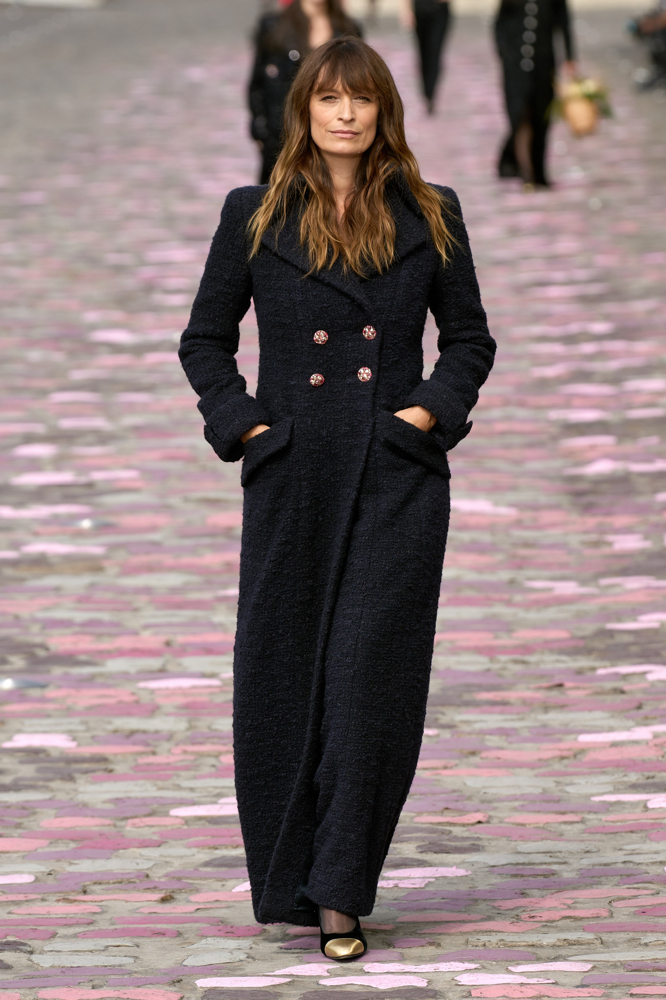

In [ ]:
import plotly.express as px
px.imshow(raw_image)

In [ ]:
photo_description = generate_description(raw_image)
print(photo_description)

## Evaluation

## Get test data

In [ ]:
import pandas as pd
#open dataset.csv
dateset_path='/content/drive/MyDrive/IndustrialML/chanel/dataset_with_long_descriptions.csv'
df = pd.read_csv(dateset_path)
image_paths = df['image_path'].tolist()
true_descriptions = df['description'].tolist()

## Generate data

In [ ]:
from PIL import Image
generated_descriptions = []

for image_path in image_paths:
  raw_image = Image.open(image_path).convert('RGB')
  description = generate_description(raw_image)
  generated_descriptions.append(description)

## ROUGE-L Score

In [ ]:
import nltk
nltk.download('all')

In [ ]:
import pandas as pd
import nltk
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

# Download required nltk data if not already available
nltk.download("punkt")

In [ ]:
print(type(image_path))

In [ ]:
# ROUGE-L evaluation function
def rouge_l_evaluation(reference, candidate):
    scorer = nltk.translate.bleu_score.SmoothingFunction().method4
    return sentence_bleu(reference, candidate, smoothing_function=scorer)


In [ ]:
import numpy as np

# Perform caption generation and ROUGE-L evaluation

def calculate_r_score(generated_descriptions, true_descriptions):
  r_scores = []
  for generated_description, true_description in zip(generated_descriptions, true_descriptions):
      rouge_l_score = rouge_l_evaluation(true_description, generated_description)
      r_scores.append(rouge_l_score)
  return np.mean(r_scores)


In [ ]:
r_score_mean = calculate_r_score(generated_descriptions, true_descriptions)
print("Average ROUGE score for test set:", r_score_mean)


## BERT embeddings

In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration, BertTokenizer, BertModel
import torch

# Initialize BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model_bert = BertModel.from_pretrained("bert-base-uncased").to("cuda")

In [ ]:
# Semantic similarity evaluation function using BERT embeddings
def semantic_similarity_evaluation(reference, candidate):
    reference_tokens = tokenizer(reference, return_tensors="pt", padding=True, truncation=True).to("cuda")
    candidate_tokens = tokenizer(candidate, return_tensors="pt", padding=True, truncation=True).to("cuda")

    with torch.no_grad():
        reference_embeddings = model_bert(**reference_tokens).last_hidden_state.mean(dim=1)
        candidate_embedding = model_bert(**candidate_tokens).last_hidden_state.mean(dim=1)

    similarity_scores = torch.cosine_similarity(reference_embeddings, candidate_embedding)
    return similarity_scores.mean().item()

In [ ]:
import numpy as np
cosine_similarity_scores = []

def calculate_cosine_similarity_scores(generated_descriptions, true_descriptions):
  for generated_description, true_description in zip(generated_descriptions, true_descriptions):
      cosine_similarity_score = semantic_similarity_evaluation(true_description, generated_description)
      cosine_similarity_scores.append(cosine_similarity_score)
  return np.mean(cosine_similarity_scores)

In [ ]:

cosine_similarity_scores_mean = calculate_cosine_similarity_scores(generated_descriptions, true_descriptions)
print("Average cosine similarity for test set:", cosine_similarity_scores_mean)

## MLFLOW Log

In [ ]:
import mlflow

# ... (Previous code)

# Initialize MLflow run
# mlflow.set_experiment('AutomateLabeling')
# mlflow.set_tracking_uri("file:/content/mlruns")

with mlflow.start_run():
    # Log parameters
    mlflow.log_param("image_path", image_path)
    mlflow.log_param("dateset_path", dateset_path)
    mlflow.log_param("image_caption_model", "Salesforce/blip-image-captioning-large")

    # Perform caption generation and ROUGE-L evaluation
    generated_descriptions = []
    for image_path in image_paths:
        raw_image = Image.open(image_path).convert('RGB')
        description = generate_description(raw_image)
        generated_descriptions.append(description)

    # Log generated descriptions as an artifact
    for idx, generated_description in enumerate(generated_descriptions):
        mlflow.log_text(generated_description, f"generated_description_{idx}.txt")

    # Log raw images as artifacts
    for idx, image_path in enumerate(image_paths):
        mlflow.log_artifact(image_path, f"raw_image_{idx}.jpg")

    # Log the dataset used for evaluation as an artifact
    mlflow.log_artifact(dateset_path, "evaluation_dataset.csv")

    # ROUGE-L evaluation
    r_score_mean = calculate_r_score(generated_descriptions, true_descriptions)
    mlflow.log_metric("r_score_mean", r_score_mean)

    # Semantic similarity evaluation using BERT embeddings
    cosine_similarity_scores_mean = calculate_cosine_similarity_scores(generated_descriptions, true_descriptions)
    mlflow.log_metric("cosine_similarity_scores_mean", cosine_similarity_scores_mean)

    # Log tags to categorize the run
    mlflow.set_tag("task", "image_captioning")
    mlflow.set_tag("dataset", "chanel")


In [ ]:
print(os.getcwd())

In [ ]:
mlflow.set_experiment('AutomateLabeling')

In [ ]:
mlflow.set_tracking_uri("file:/content/mlruns")


In [ ]:
with mlflow.start_run():
  mlflow.log_metric("r_score_mean",r_score_mean)
  mlflow.log_metric("cosine_similarity_scores_mean",cosine_similarity_scores_mean)

# Experiment 2

## Load model from huggingface and make an inference

In [ ]:
from transformers import AutoProcessor, BlipForConditionalGeneration

processor1 = AutoProcessor.from_pretrained("alesanm/blip-image-captioning-base-fashionimages-finetuned-processor")
model1 = BlipForConditionalGeneration.from_pretrained("alesanm/blip-image-captioning-base-fashionimages-finetuned")

In [ ]:
def get_basic_descr(processor_blip_ft, model_blip_ft, image):
  # conditional image captioning
  text = "a photography of"
  inputs = processor_blip_ft(raw_image, text, return_tensors="pt").to("cuda")

  out = model_blip_ft.generate(**inputs)
  descr = processor_blip_ft.decode(out[0], skip_special_tokens=True)
  return descr

In [ ]:
def generate_open_questions_descr(image, processor_zhic, model_zhic, queries):
  answers = []
  for idx, query in enumerate(queries):
    classes = query_classes[idx]
    inputs = processor_zhic(text=classes, images=image, return_tensors="pt", padding=True)
    outputs = model_zhic(**inputs)
    logits_per_image = outputs.logits_per_image # this is the image-text similarity score
    probs = logits_per_image.softmax(dim=1) # we can take the softmax to get the label probabilities

    max = logits_per_image.argmax(-1).item()
    answers.append(query + '\n' + classes[max])
  return '\n'.join(answers)

In [ ]:
def generate_description(image):
  description = ""
  description += get_basic_descr(processor1, model1, image)
  description += ' \n'+ generate_open_questions_descr(image, processor_zhic, model_zhic, queries)
  return description

In [ ]:
from PIL import Image
import torch

example_img= Image.open('/content/drive/MyDrive/IndustrialML/chanel/chanel_17.jpg')

In [ ]:
model1 = model1.to(torch.device("cuda"))

In [ ]:
# Check if a GPU is available and use it, otherwise use the CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs = processor1(images=example_img, return_tensors="pt").to(device)
pixel_values = inputs.pixel_values

generated_ids = model1.generate(pixel_values=pixel_values, max_length=50)
generated_caption = processor1.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_caption)

clothes : formal, eveningwear colors : metallic, ivory occasion : gala, special event details : sequins, beading trends : glamorous, sparkly figures : slender, petite demographic : women, 18 - 35


## Inference

Let's check the results on our train dataset

In [ ]:
# load image
example = Image.open('/content/drive/MyDrive/IndustrialML/chanel/chanel_17.jpg')

In [ ]:
# prepare image for the model
inputs = processor1(images=example, return_tensors="pt").to(device)
pixel_values = inputs.pixel_values

generated_ids = model1.generate(pixel_values=pixel_values, max_length=50)
generated_caption = processor1.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_caption)

clothes : formal, eveningwear colors : metallic, ivory occasion : gala, special event details : sequins, beading trends : glamorous, sparkly figures : slender, petite demographic : women, 18 - 35


## Evaluation

In [ ]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.metrics.pairwise import cosine_similarity

# Load pre-trained BERT model and tokenizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model_bert = BertModel.from_pretrained("bert-base-uncased")

In [ ]:
def get_sentence_embeddings(sentences, tokenizer, model):
    # Tokenize the sentences and convert them to tensors
    inputs = tokenizer(sentences, padding=True, truncation=True, return_tensors="pt")
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]

    # Get the sentence embeddings
    with torch.no_grad():
        outputs = model_bert(input_ids, attention_mask=attention_mask)
        embeddings = outputs.last_hidden_state.mean(dim=1)  # Average pooling

    return embeddings

## Experiment 2 evaluation (Sasha)

### Get test data

In [ ]:
import pandas as pd
# link to test data:  https://drive.google.com/file/d/1W4cq7YIentjzdvOX9NJ2KK74aEngHmbp/view?usp=sharing
dateset_path_exprmt2 ='/content/drive/MyDrive/IndustrialML/chanel/dataset_with_short_descriptions.csv'
df_exprmt2 = pd.read_csv(dateset_path_exprmt2)
image_paths_exprmt2 = df_exprmt2['image_path'].tolist()
true_descriptions_exprmt2 = df_exprmt2['description'].tolist()

### Generate data

In [ ]:
from PIL import Image
generated_descriptions_exprmt2 = []
model1.to(device)
model1.eval()

for image_path in image_paths_exprmt2:
  raw_image = Image.open(image_path).convert('RGB')

  inputs = processor1(images=raw_image, return_tensors="pt").to(device)
  pixel_values = inputs.pixel_values
  generated_ids = model1.generate(pixel_values=pixel_values, max_length=300)
  description = processor1.batch_decode(generated_ids, skip_special_tokens=True)[0]
  generated_descriptions_exprmt2.append(description)

KeyboardInterrupt: ignored

### ROUGE-L Score

In [ ]:
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping grammars/basque_grammars.zip.
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   U

True

In [ ]:
import pandas as pd
import nltk
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

# Download required nltk data if not already available
nltk.download("punkt")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# ROUGE-L evaluation function
def rouge_l_evaluation(reference, candidate):
    scorer = nltk.translate.bleu_score.SmoothingFunction().method4
    return sentence_bleu(reference, candidate, smoothing_function=scorer)


In [ ]:
import numpy as np

# Perform caption generation and ROUGE-L evaluation
def calculate_r_score(generated_descriptions, true_descriptions):
  r_scores = []
  for generated_description, true_description in zip(generated_descriptions, true_descriptions):
      rouge_l_score = rouge_l_evaluation(true_description, generated_description)
      r_scores.append(rouge_l_score)
  return np.mean(r_scores)


In [ ]:
r_score_mean_exprmt2 = calculate_r_score(generated_descriptions_exprmt2, true_descriptions_exprmt2)
print("Average ROUGE score for test set:", r_score_mean_exprmt2)

Average ROUGE score for test set: 0.0038149296819902927


### BERT embeddings

In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration, BertTokenizer, BertModel
import torch

# Initialize BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model_bert = BertModel.from_pretrained("bert-base-uncased").to("cuda")

In [ ]:
# Semantic similarity evaluation function using BERT embeddings
def semantic_similarity_evaluation(reference, candidate):
    reference_tokens = tokenizer(reference, return_tensors="pt", padding=True, truncation=True).to("cuda")
    candidate_tokens = tokenizer(candidate, return_tensors="pt", padding=True, truncation=True).to("cuda")

    with torch.no_grad():
        reference_embeddings = model_bert(**reference_tokens).last_hidden_state.mean(dim=1)
        candidate_embedding = model_bert(**candidate_tokens).last_hidden_state.mean(dim=1)

    similarity_scores = torch.cosine_similarity(reference_embeddings, candidate_embedding)
    return similarity_scores.mean().item()

In [ ]:
import numpy as np

def calculate_cosine_similarity_scores(generated_descriptions, true_descriptions):
    cosine_similarity_scores = []
    for generated_description, true_description in zip(generated_descriptions, true_descriptions):
        cosine_similarity_score = semantic_similarity_evaluation(true_description, generated_description)
        cosine_similarity_scores.append(cosine_similarity_score)
    return np.mean(cosine_similarity_scores)

In [ ]:

cosine_similarity_scores_mean_exprmt2 = calculate_cosine_similarity_scores(generated_descriptions_exprmt2, true_descriptions_exprmt2)
print("Average cosine similarity for test set:", cosine_similarity_scores_mean_exprmt2)

Average cosine similarity for test set: 0.9521672129631042


# Logging

In [ ]:
import mlflow

# Initialize MLflow run
# mlflow.set_experiment('AutomateLabeling')
mlflow.set_tracking_uri("file:/content/mlruns")

# Create a parent run to group all the image processing and evaluation runs
with mlflow.start_run():
    # Log parameters (excluding the image paths)
    mlflow.log_param("dateset_path", dateset_path_exprmt2)
    mlflow.log_param("image_caption_model", "alesanm/blip-image-captioning-base-fashionimages-finetuned")

    generated_descriptions = []
    # Log image paths individually using nested runs
    for idx, image_path in enumerate(image_paths_exprmt2):
        # with mlflow.start_run(nested=True):
        #     mlflow.log_param("image_path", image_path)

        raw_image = Image.open(image_path).convert('RGB')
        description = generate_description(raw_image)
        generated_descriptions.append(description)

        # Log generated descriptions as an artifact
        mlflow.log_text(description, f"generated_description_{idx}.txt")

        # Log raw image as an artifact
        mlflow.log_artifact(image_path, f"raw_image_{idx}.jpg")

    # Log the dataset used for evaluation as an artifact
    mlflow.log_artifact(dateset_path_exprmt2, "evaluation_dataset.csv")

    # ROUGE-L evaluation
    r_score_mean = calculate_r_score(generated_descriptions, true_descriptions_exprmt2)
    mlflow.log_metric("r_score_mean", r_score_mean)

    # Semantic similarity evaluation using BERT embeddings
    cosine_similarity_scores_mean = calculate_cosine_similarity_scores(generated_descriptions, true_descriptions_exprmt2)
    mlflow.log_metric("cosine_similarity_scores_mean", cosine_similarity_scores_mean)

    # Log tags to categorize the parent run
    mlflow.set_tag("task", "image_captioning")
    mlflow.set_tag("dataset", "chanel")


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1369: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


## Download mlruns folder

In [ ]:
import zipfile
import os

# Path to the mlruns folder
folder_path = "/content/mlruns/"

# Zip file name
zip_file_name = "mlruns.zip"

# Create a zip file containing the contents of the folder
with zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, folder_path))


In [ ]:
from google.colab import files

# Download the zip file
files.download(zip_file_name)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>